# Advanced lane finding project

## The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

# Note 
I have two different pipeline :
### Method 1:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* ** Apply a perspective transform to raw images ("birds-eye view").**
* ** Use color transforms, gradients, etc., to create a thresholded binary image from bird-eye view.**
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Method 2:
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* **Use color transforms, gradients, etc., to create a thresholded binary image.**
* **Apply a perspective transform to rectify binary image ("birds-eye view").**
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

The wwrite up is accoring to method 1. Method 2 was implemented by just changing the varible names.

I am getting pretty good result with the method 1, just tried method 2 as it was bugging. Surprisingly result is a bit better.

Method 1 video name is VideoMethod1.mp4
Method 2 video name is VideoMethod2.mp4

## Camera Calibration
The goal here is to find the coefficients for camera calibration. We need these becauase we always do not get the original image as seen by us. Due to curvature of the camera lense there is some distortion in the image. We thus here take chessboard images from the same camera and try to find the parameters related for camera calibration. We take chessboard here because it is easy to visualize. Also since once we have these parameters we don't have to calculate them again for every image because we are using same camera throughout the video.

Moreover it is very much easier to visualize the undistorted chessboard image

I am here assuming that chessboard is fixed in (x,y) plane at z = 0. Therefore I have taken out chessboard corners in the real world and named then as "objpoints". The chessboard points in the distorted image is names as "imgpoints".

Total images : 20


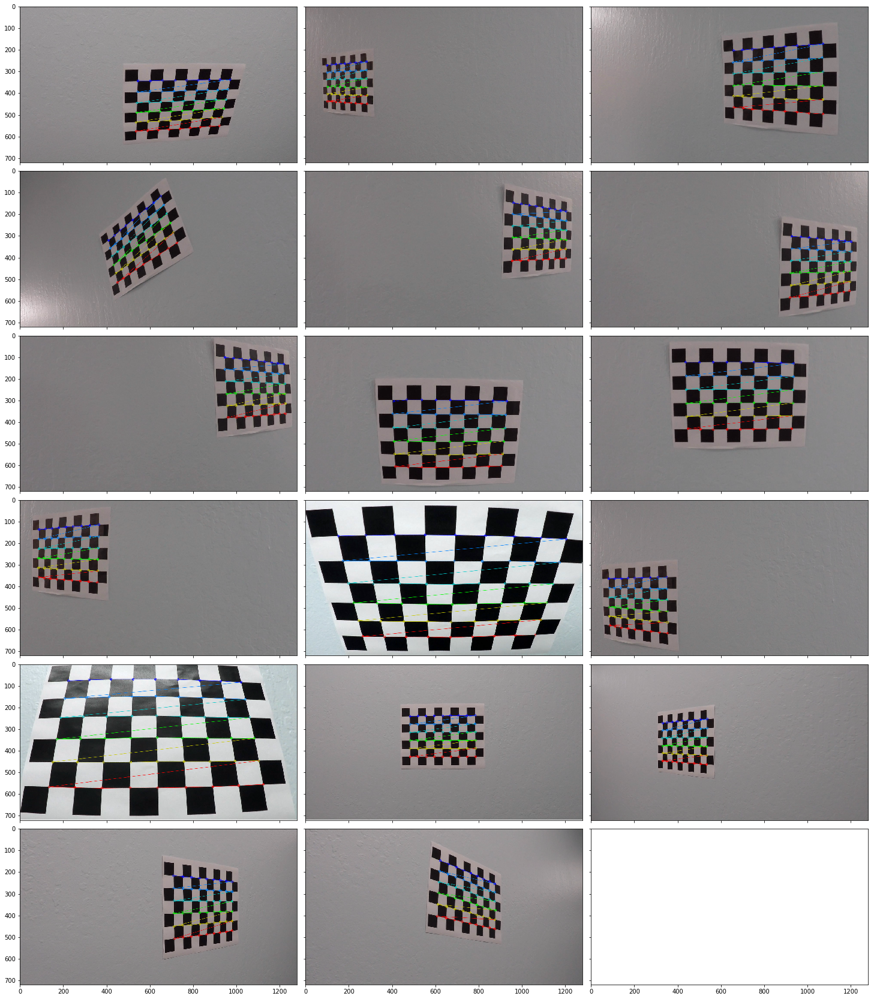

Done


In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt
%matplotlib inline
from mpl_toolkits.axes_grid1 import ImageGrid


# preparing the object points, like (0,0,0), (1,0,0), (2,0,0) ....,(8,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9, 0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# List of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

i = 0
fig = plt.figure(1, (30, 30))
grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(6, 3),  # creates 6x3 grid of axes
                 axes_pad=0.2,  # pad between axes in inch.
                 )


print("Total images :" , len(images))
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6), None)    
    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        # Draw and display the corners
        cv2.drawChessboardCorners(img, (9,6), corners, ret)
        ax = grid[i]
        ax.imshow(img)
        i = i +1
plt.show()

print("Done")

Now I have objpoints and imgpoints needed for camera calibration. I can thus calculate distortion coefficients, and test undistortion on an image!

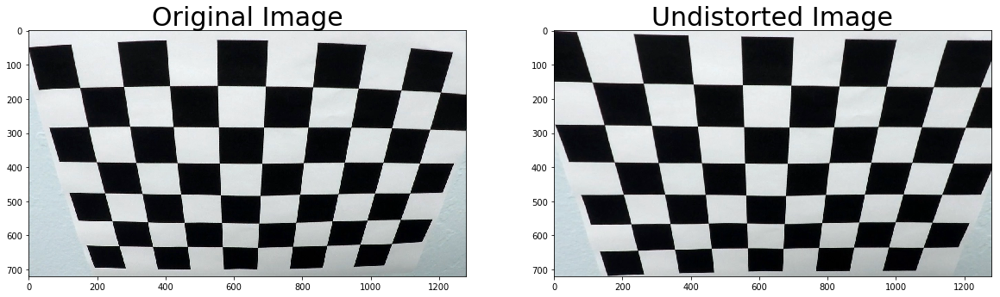

In [2]:
import pickle
%matplotlib inline

# Undistortion on an image
img = cv2.imread('camera_cal/test_image.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)


dst = cv2.undistort(img, mtx, dist, None, mtx)
cv2.imwrite('camera_cal/test_undist.jpg',dst)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
#dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)

### The image was distorted successfully

## Perspective transform

Why are we using perspective transform? The reason behid using the perspective transform is that when we see the lane lines from the normal camera view we see them converging like a triangle, whereas they are actually not converging. Also by using bird-eye-view of the same image helps us get the better visualization of the line in terms of turns etc. So here I am performing the perspective transfrom to bird-eye-view or the top-view of the lane lines.

I have two main functions defined in the bloack below.

The **get_src_destination_points_perspective_transform** has 3 sets of src and destination points. Why 3 sets ? Isn't one enough? One is sufficient but during the project I tried various set so I have put them in a function to testing which gives better results.

The **corners_unwarp** function is used to undistort the image and give a top-view of the image. For this it takes various parameters as input like camera matrix(calculated using chessboard images), souce and destination points , and distortion coefficients etc.  

In [3]:
#import pickle
#import cv2
#import numpy as np
#import matplotlib.pyplot as plt
#import matplotlib.image as mpimg

def get_src_destination_points_perspective_transform(index):
    if index == 1 :
        #set 1
        offset=10  
        src_bottom_left = [260,680]
        src_bottom_right = [1040,680]
        src_top_left = [581,460]
        src_top_right = [700,460]

        destination_bottom_left = [100,700]
        destination_bottom_right = [1000,700]
        destination_top_left = [100,50]
        destination_top_right = [1000,50]

        src = np.float32([[src_top_left,src_top_right,src_bottom_right,src_bottom_left]])
        dst_points = np.float32([[destination_top_left,destination_top_right,destination_bottom_right,destination_bottom_left]])
    elif index == 2 :
        #set 2
        src = np.float32([[(200, 720), (570, 470), (720, 470), (1130, 720)]])
        dst_points = np.float32([[(350, 720), (350, 0), (980, 0), (980, 720)]])
    
    elif index == 3 :
        #set 3
        offset_x = 400 # offset for dst points
        offset_y = 50

        src = np.float32([[610,440], [670, 440], [1040, 680], [260, 680]])
        dst_points = np.float32([[offset_x, offset_y], [img_size[0]-offset_x, offset_y],
                                    [img_size[0]-offset_x, img_size[1]-offset_y],
                                   [offset_x, img_size[1]-offset_y]])
    else :
        src = np.float32([[(200, 720), (570, 470), (720, 470), (1130, 720)]])
        dst_points = np.float32([[(350, 720), (350, 0), (980, 0), (980, 720)]])
    return src, dst_points

def carmera_parameters():
    # Read in the saved camera matrix and distortion coefficients
    # These are the arrays calculated using cv2.calibrateCamera()
    dist_pickle = pickle.load( open( "camera_cal/wide_dist_pickle.p", "rb" ) )
    mtx = dist_pickle["mtx"]
    dist = dist_pickle["dist"]
    return mtx,dist

def corners_unwarp(img, src, dst_points, print_statements=False):
    
    mtx,dist_coeff = carmera_parameters()
    
    #Undistort using mtx and dist.
    undis = cv2.undistort(img, mtx, dist, None, mtx)

    if print_statements == True :
        print('Calibration matrix :' , mtx)
        print('Image shape : ',img.shape)
        
    M = cv2.getPerspectiveTransform(src, dst_points)
    warped = cv2.warpPerspective(undis, M, (img.shape[1],img.shape[0]), flags=cv2.INTER_LINEAR)
    
    dist_pickle = {}
    dist_pickle["mtx"] = mtx
    dist_pickle["dist"] = dist
    dist_pickle["M"] = M
    pickle.dump( dist_pickle, open( "camera_cal/wide_dist_pickle.p", "wb" ) )
    
    return warped, M, undis
print('Done')

Done


In [4]:
def print_undistorted_and_warped_images(image1, image2, text1= 'Original Image', text2 = 'Undistorted and Warped Image'):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image1)
    ax1.set_title(text1, fontsize=50)
    ax2.imshow(image2)
    ax2.set_title(text2, fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

def print_4_images(img1,img2,img3,img4,txt1,txt2,txt3,txt4):
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 30))
    f.tight_layout()
    ax1.imshow(img1,cmap='gray')
    ax1.set_title(txt1, fontsize=50)
    ax2.imshow(img2,cmap='gray')
    ax2.set_title(txt2, fontsize=50)
    ax3.imshow(img3,cmap='gray')
    ax3.set_title(txt3, fontsize=50)
    ax4.imshow(img4,cmap='gray')
    ax4.set_title(txt4, fontsize=50)
    
def print_2_images (img1,img2,txt1='',txt2=''):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(30, 30))
    f.tight_layout()
    ax1.imshow(img1,cmap='gray')
    ax1.set_title(txt1, fontsize=50)
    ax2.imshow(img2,cmap='gray')
    ax2.set_title(txt2, fontsize=50)

## Color channels 
Printing various color channels for visualization to check which channel detects what.

Printing BGR, HSV and HLS color channels.

### BGR Color channels

In [5]:
def print_bgr_color_images(img) :
    #grayscale image
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    #b,g,r image
    b_img = img[:,:,0]
    g_img = img[:,:,1]
    r_img = img[:,:,2]

    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 30))
    f.tight_layout()
    ax1.imshow(gray,cmap='gray')
    ax1.set_title('gray', fontsize=50)
    ax2.imshow(b_img,cmap='gray')
    ax2.set_title('b_img', fontsize=50)
    ax3.imshow(g_img,cmap='gray')
    ax3.set_title('g_img', fontsize=50)
    ax4.imshow(r_img,cmap='gray')
    ax4.set_title('r_img', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)


### HLS Color channels

In [6]:
def print_hls_color_images(img) :
    #RGB to HLS
    hls_image = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)
    
    h_img = hls_image[:,:,0]
    l_img = hls_image[:,:,1]
    s_img = hls_image[:,:,2]

    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 30))
    f.tight_layout()
    ax1.imshow(hls_image)
    ax1.set_title('hls_image', fontsize=50)
    ax2.imshow(h_img,cmap='gray')
    ax2.set_title('h_img', fontsize=50)
    ax3.imshow(l_img,cmap='gray')
    ax3.set_title('l_img', fontsize=50)
    ax4.imshow(s_img,cmap='gray')
    ax4.set_title('s_img', fontsize=50)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## HSV Color Channels

In [7]:
def print_hsv_color_images(img) :

    #RGB to HLS
    hsv_image = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    hsv_h_img = hsv_image[:,:,0]
    hsv_s_img = hsv_image[:,:,1]
    hsv_v_img = hsv_image[:,:,2]

    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(30, 30))
    f.tight_layout()
    ax1.imshow(hsv_image)
    ax1.set_title('hsv_image', fontsize=50)
    ax2.imshow(hsv_h_img,cmap='gray')
    ax2.set_title('hsv_h_img', fontsize=50)
    ax3.imshow(hsv_s_img,cmap='gray')
    ax3.set_title('hsv_s_img', fontsize=50)
    ax4.imshow(hsv_v_img,cmap='gray')
    ax4.set_title('hsv_v_img', fontsize=50)

## Threshold functions for sobel

Defining various sobel threshold functions. These are visualized later to help in choosing the bast combination for lane lines detection.

In [8]:
def abs_sobel_thresh(image, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # Steps fro abs sobel
    # 1) Converting to grayscale
    image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    # 2) Taking the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x' :
        sobelx = cv2.Sobel(image, cv2.CV_64F, 1, 0)
    else :
        sobely = cv2.Sobel(image, cv2.CV_64F, 0, 1)
    # 3) Taking the absolute value of the derivative or gradient  
    if orient == 'x' :
        absSobel = abs(sobelx)
    else :
        absSobel = abs(sobely)
    # 4) Scaling to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*absSobel/(np.max(absSobel)))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
    masked_output = np.zeros_like(scaled_sobel)        
    masked_output [(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1   
    binary_output = np.copy(masked_output)
    return binary_output

def mag_thresh(image, sobel_kernel=3, mag_thresh=(0, 255)):
    # 1) Converting to grayscale
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    # 2) Taking the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculating the magnitude 
    mag = np.sqrt(sobelx*sobelx+sobely*sobely)
    # 4) Scaling to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag/(np.max(mag)))
    # 5) Creating a binary mask where mag thresholds are met
    masked_sobel = np.zeros_like(scaled_sobel)
    masked_sobel[ (scaled_sobel>=mag_thresh[0]) & (scaled_sobel<= mag_thresh[1]) ] = 1
    binary_output = np.copy(masked_sobel)
    return binary_output

def dir_threshold(image, sobel_kernel=3, thresh=(0, np.pi/2)):
    # 1) Converting to grayscale
    gray = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    # 2) Taking the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Taking the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Using np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    direction_gradient = np.arctan2(abs_sobely,abs_sobelx)
    # 5) Creating a binary mask where direction thresholds are met
    masked_sobel = np.zeros_like(direction_gradient)
    masked_sobel[ (direction_gradient >= thresh[0]) & (direction_gradient <= thresh[1]) ] = 1
    # 6) Return this mask as masked_sobel image
    return masked_sobel

## Threshold for color spaces
After visualizing the color channel results, I have taken decided to use red binary, green binary and s binary from HLS color space.

In [9]:
def red_threshold(bird_eye_view_image, thresh = (200,255)):
    r_img = bird_eye_view_image[:,:,2]
    binary_red = np.zeros_like(r_img)
    binary_red[(r_img > thresh[0]) & (r_img <= thresh[1])] = 1
    return binary_red

def green_threshold(bird_eye_view_image, thresh = (200,255)):
    g_img = bird_eye_view_image[:,:,1]
    binary_green = np.zeros_like(g_img)
    binary_green[(g_img > thresh[0]) & (g_img <= thresh[1])] = 1
    return binary_green


def hls_s_threshold(bird_eye_view_image, thresh = (90, 255)):
    hls_image = cv2.cvtColor(bird_eye_view_image, cv2.COLOR_BGR2HLS)
    s_img = hls_image[:,:,2]
    binary_s_hls = np.zeros_like(s_img)
    binary_s_hls[(s_img > thresh[0]) & (s_img <= thresh[1])] = 1
    return binary_s_hls

## Process the image - test block (Can be ignored as used for testing purposes)

This block is the testing block to check the pipeline process to get a good binary image after appling sobel and color binaries.

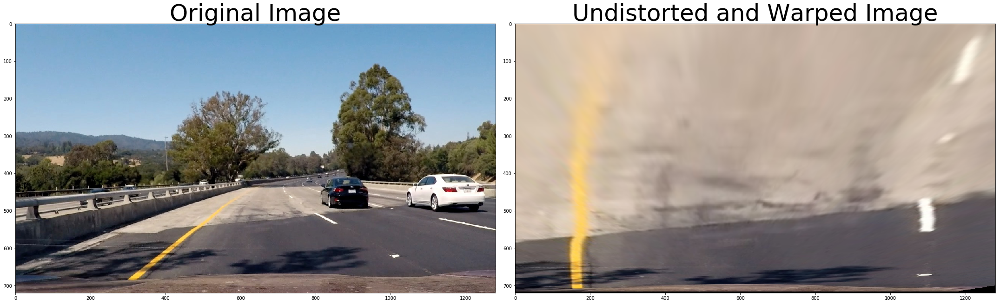

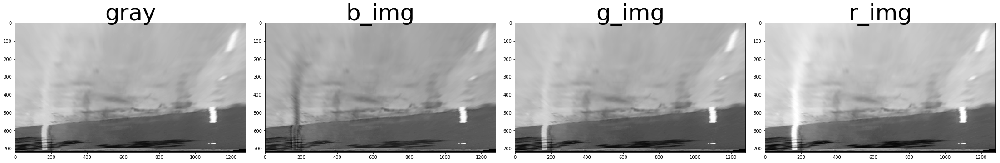

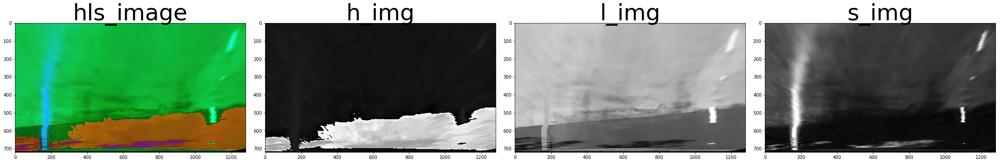

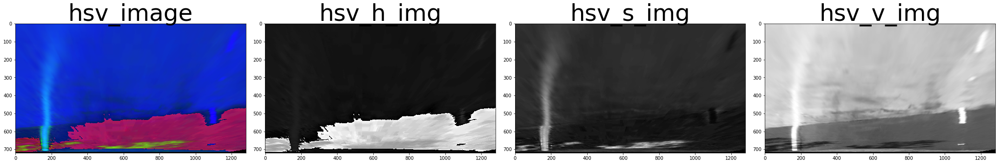

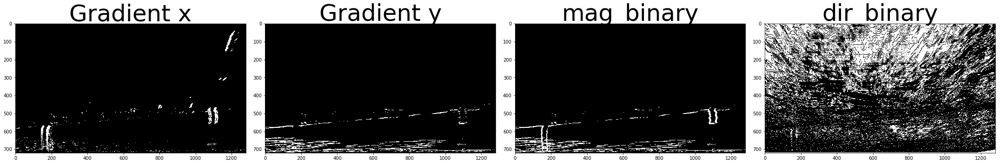

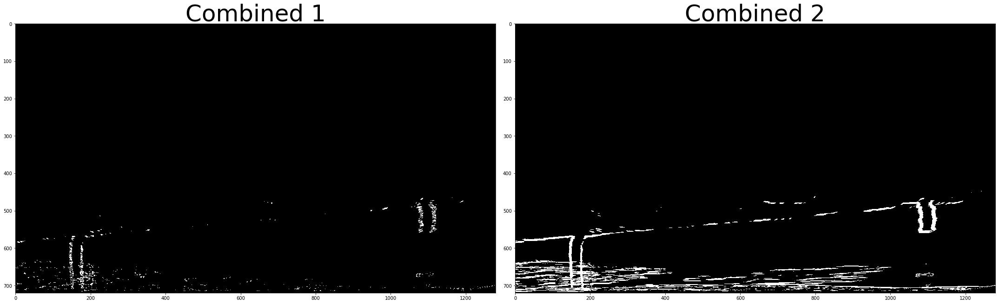

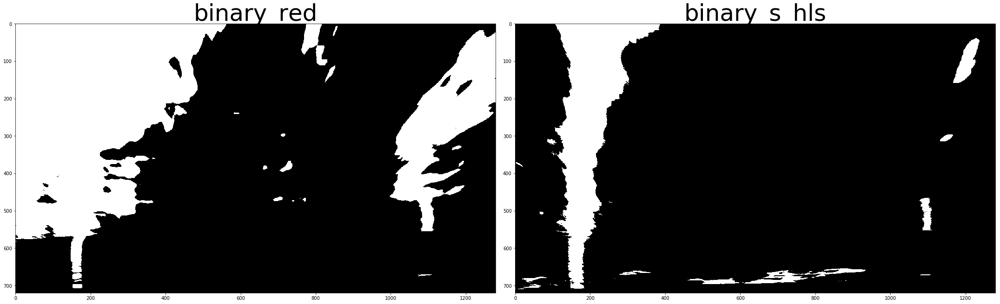

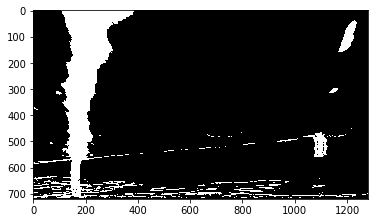

In [10]:
nx = 9
ny = 6
img = cv2.imread('test_images/test4.jpg')
ksize = 3
bird_eye_view_image = []
def process_the_image(img):
    #img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    src, dst_points = get_src_destination_points_perspective_transform(index=1)
    
    mtx,dist_coeff = carmera_parameters()
    top_down, perspective_M, undist = corners_unwarp(img, src, dst_points, print_statements=False)
    
    #print_undistorted_and_warped_images(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),cv2.cvtColor(top_down,cv2.COLOR_BGR2RGB))
    print_2_images(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),cv2.cvtColor(top_down,cv2.COLOR_BGR2RGB), 'Original Image', 'Undistorted and Warped Image')
    cv2.imwrite('test_images/bird_eye_test5.jpg',top_down)
    
    bird_eye_view_image = np.copy(top_down)
    
    print_bgr_color_images(bird_eye_view_image)
    print_hls_color_images(bird_eye_view_image)
    print_hsv_color_images(bird_eye_view_image)
    
    gradx = abs_sobel_thresh(bird_eye_view_image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(bird_eye_view_image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(bird_eye_view_image, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(bird_eye_view_image, sobel_kernel=ksize, thresh=(0, 0.2))
    print_4_images(gradx,grady,mag_binary,dir_binary,'Gradient x','Gradient y','mag_binary','dir_binary')
    
    #Combined threshols sobel
    combined = np.zeros_like(dir_binary)
    combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #==========================================================#
    combined_2 = np.zeros_like(dir_binary)
    combined_2[((gradx == 1) & (grady == 1)) | ((mag_binary == 1))] = 1
    #==========================================================#
    print_2_images(combined,combined_2,'Combined 1','Combined 2')
    #==========================================================#
    
    
    #Color thresholding
    #=======================================================#
    r_img = bird_eye_view_image[:,:,2]
    
    thresh = (200, 255)
    binary_red = np.zeros_like(r_img)
    binary_red[(r_img > thresh[0]) & (r_img <= thresh[1])] = 1
    #=======================================================#
    #=======================================================#
    hls_image = cv2.cvtColor(bird_eye_view_image, cv2.COLOR_BGR2HLS)
    s_img = hls_image[:,:,2]
    
    thresh = (90, 255)
    binary_s_hls = np.zeros_like(s_img)
    binary_s_hls[(s_img > thresh[0]) & (s_img <= thresh[1])] = 1
    #=======================================================#
    print_2_images(binary_red,binary_s_hls,'binary_red','binary_s_hls')
    #==========================================================#
    
    
    combined_try1 = np.zeros_like(mag_binary)
    combined_try1[((gradx == 1) & (grady == 1)) | ((mag_binary == 1)) | (binary_red==1) & (binary_s_hls==1)] = 1
    plt.figure()
    plt.imshow(combined_try1,cmap='gray')
    
    return combined_try1, bird_eye_view_image, undist
processed_image, bird_eye_view_image, undist = process_the_image(img)

## Histogram and Minv

Here I am getting histogram of the comibned binary image. The histogram helps us find the lane lines by detecting the starting points of the lane lines. After detecting the initial points I have used sliding window method to get the other points of lane lines.


Minv is needed to change the detected driving portion back to overlap with original image

In [11]:
def get_histogram(combined_binay, print_statements=False):
    histogram = np.sum(combined_binay[combined_binay.shape[0]//2:,:], axis=0)   
    if print_statements==True:
        plt.plot(histogram,linewidth=2.5,color='yellow')
    return histogram

def get_Minv(src,dst_points):
    Minv = cv2.getPerspectiveTransform(dst_points, src)
    return Minv

## Pipeline for the 
Get the starting point of the lane lines using the histogram. Get the lane line points using sliding window and then build the polynomial. Once we get the starting point of the lane lines and the polynomial function, we can skip the sliding window part for the next frame until we encounter a bad frame.

This skipping the sliding window part saves a lot of computation. It also shows the polynomial on the lane lines. However the output is shown when the function is called and not after this block.

Using count variable to check when to use sliding window and when to skip. Use the sliding window in the first frame and then use the previous polynomial for the next frame. If somehow there is error or less ponits are detected in the polynomial for the next frame, shift to sliding window. 


In [12]:
def lane_line(count,left_fitx, left_fit, right_fitx, right_fit, Minv, bird_eye_view_image, undist, histogram, processed_image, print_image_statment=False) :
    #print(count)
    #using count to check when to use sliding window and when to skip. 
    if count==0 :
        # Create an output image to draw on and  visualize the result
        out_img = np.dstack((processed_image, processed_image, processed_image))*255
        if print_image_statment == True :
            plt.imshow(out_img)
            print("out_img :", out_img.shape)
        # Find the peak of the left and right halves of the histogram
        # These will be the starting point for the left and right lines
        midpoint = np.int(histogram.shape[0]/2)
        leftx_base = np.argmax(histogram[:midpoint])
        rightx_base = np.argmax(histogram[midpoint:]) + midpoint

        # Choose the number of sliding windows
        nwindows = 9
        # Set height of windows
        window_height = np.int(processed_image.shape[0]/nwindows)
        # Identify the x and y positions of all nonzero pixels in the image
        nonzero = processed_image.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Current positions to be updated for each window
        leftx_current = leftx_base
        rightx_current = rightx_base
        # Set the width of the windows +/- margin
        margin = 100
        # Set minimum number of pixels found to recenter window
        minpix = 50
        # Create empty lists to receive left and right lane pixel indices
        left_lane_inds = []
        right_lane_inds = []

        # Step through the windows one by one
        for window in range(nwindows):
            # Identify window boundaries in x and y (and right and left)
            win_y_low = processed_image.shape[0] - (window+1)*window_height
            win_y_high = processed_image.shape[0] - window*window_height
            win_xleft_low = leftx_current - margin
            win_xleft_high = leftx_current + margin
            win_xright_low = rightx_current - margin
            win_xright_high = rightx_current + margin
            # Draw the windows on the visualization image
            cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),
            (0,255,0), 2) 
            cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high),
            (0,255,0), 2) 
            # Identify the nonzero pixels in x and y within the window
            good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
            good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
            (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
            # Append these indices to the lists
            left_lane_inds.append(good_left_inds)
            right_lane_inds.append(good_right_inds)
            # If you found > minpix pixels, recenter next window on their mean position
            if len(good_left_inds) > minpix:
                leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
            if len(good_right_inds) > minpix:        
                rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

        # Concatenate the arrays of indices
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)

        # Extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds] 

        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)

        if print_image_statment == True :
            print(leftx_current)
            print(rightx_current)

            print(left_lane_inds)
            print(right_lane_inds)

            print(len(left_lane_inds))
            print(len(right_lane_inds))



        #=====================================================#
        ploty = np.linspace(0, processed_image.shape[0]-1, processed_image.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        
        if print_image_statment == True :
            plt.figure()
            plt.imshow(out_img)
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')
            plt.xlim(0, 1280)
            plt.ylim(720, 0)
        result = out_img
    else :
        #===================================================#
        # Assume you now have a new warped binary image 
        # from the next frame of video (also called "binary_warped")
        # It's now much easier to find line pixels!
        nonzero = processed_image.nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        margin = 100
        left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + 
        left_fit[2] - margin)) & (nonzerox < (left_fit[0]*(nonzeroy**2) + 
        left_fit[1]*nonzeroy + left_fit[2] + margin))) 

        right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + 
        right_fit[2] - margin)) & (nonzerox < (right_fit[0]*(nonzeroy**2) + 
        right_fit[1]*nonzeroy + right_fit[2] + margin)))  

        # Again, extract left and right line pixel positions
        leftx = nonzerox[left_lane_inds]
        lefty = nonzeroy[left_lane_inds] 
        rightx = nonzerox[right_lane_inds]
        righty = nonzeroy[right_lane_inds]
        # Fit a second order polynomial to each
        left_fit = np.polyfit(lefty, leftx, 2)
        right_fit = np.polyfit(righty, rightx, 2)
        # Generate x and y values for plotting
        ploty = np.linspace(0, processed_image.shape[0]-1, processed_image.shape[0] )
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
        #=======================================================#






        # Create an image to draw on and an image to show the selection window
        out_img = np.dstack((processed_image, processed_image, processed_image))*255
        window_img = np.zeros_like(out_img)
        # Color in left and right line pixels
        out_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]

        # Generate a polygon to illustrate the search window area
        # And recast the x and y points into usable format for cv2.fillPoly()
        left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-margin, ploty]))])
        left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+margin, 
                                      ploty])))])
        left_line_pts = np.hstack((left_line_window1, left_line_window2))
        right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-margin, ploty]))])
        right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+margin, 
                                      ploty])))])
        right_line_pts = np.hstack((right_line_window1, right_line_window2))

        # Draw the lane onto the warped blank image
        cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
        cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
        result = cv2.addWeighted(out_img, 1, window_img, 0.3, 0)
        
        if print_image_statment == True :
            plt.figure()
            plt.imshow(result)
            plt.plot(left_fitx, ploty, color='yellow')
            plt.plot(right_fitx, ploty, color='yellow')
            plt.xlim(0, 1280)
            plt.ylim(720, 0)
            
    return left_fitx, left_fit, leftx, right_fitx, right_fit, rightx, ploty, result



#left_fitx, left_fit, right_fit = lane_line(count, left_fitx, left_fit, right_fit, Minv, bird_eye_view_image, undist)
#count= count+1

## Unwarp and fill the polygon

Here we pass the x  and y arrays for left lane and right lane, plot the polygon, and then do a perspective transform to plot it on the original image.

In [13]:
def unwarp_and_fillPoly(image, combined_binary, left_fitx, right_fitx, ploty, Minv, undist, print_image_statments=False) :  
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(combined_binary).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    if print_image_statments == True :
        print("color warp shape", color_warp.shape)
        print("warp zero shape", warp_zero.shape)
        print(type(color_warp))
    #plt.imshow(color_warp)
    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (image.shape[1], image.shape[0])) 
    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)
    
    if print_image_statments == True :
        plt.figure()
        plt.imshow(result)
 
    
    return result    

## Radius of curvature and center offset
Finding the radius of curvature and center offset here. Offset is difference of center of image with center of the lane lines. 

In [14]:
def set_raduis_curvature(ploty , left_fitx, right_fitx, final_image) :
    y_eval = np.max(ploty)  
    
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension

    # Fit new polynomials to x,y in world space
    left_fit_cr = np.polyfit(ploty*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty*ym_per_pix, right_fitx*xm_per_pix, 2)
    # Calculate the new radii of curvature
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(final_image, 'Radius of Curvature left curved : '+ str(left_curverad)[:6]+ 'm', (20,40), font, 1, (255,255,255), 2)
    cv2.putText(final_image, 'Radius of Curvature right curved : '+ str(right_curverad)[:6]+ 'm', (20,80), font, 1, (255,255,255), 2)
    
    return final_image

def set_center(left_line_x, right_line_x,final_image) :
    
    #y_max = np.max(ploty)
    offset = 640 - (right_line_x + left_line_x)/2
    offset_meter = offset*3.7/700
    font = cv2.FONT_HERSHEY_SIMPLEX
    cv2.putText(final_image, 'Center '+ str(offset_meter)[:6]+ 'm', (20,120), font, 1, (255,255,255), 2)
    
    return final_image
    

### Convert 1-D array to 3-D for stacking images together

In [15]:
def binary_to_stack_fit(image) :
    return (np.dstack((image, image, image))*255).astype(np.uint8)

## Process the image to get the final output
This is the main function from where all the functions are called to generate the output. I am using various global variables to keep track of variables from 1st frame.

## Output images: 
    

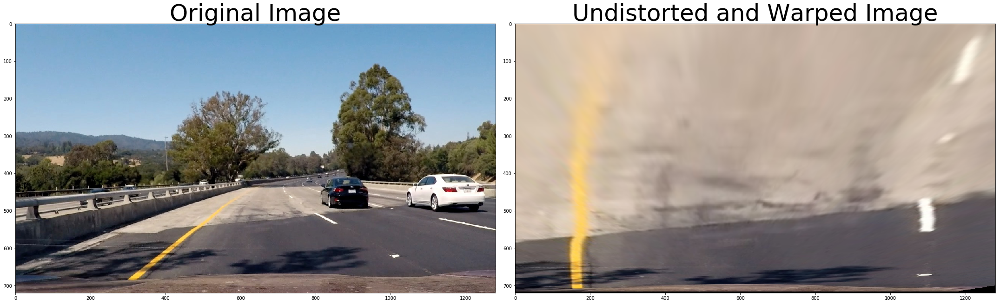

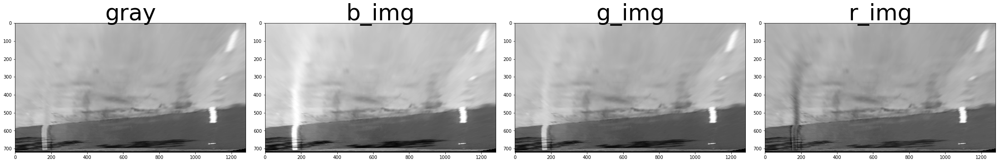

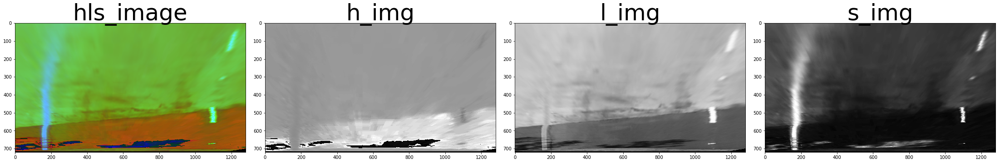

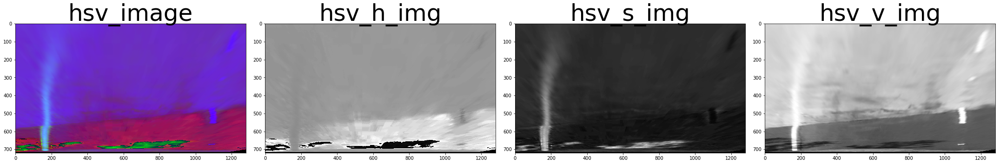

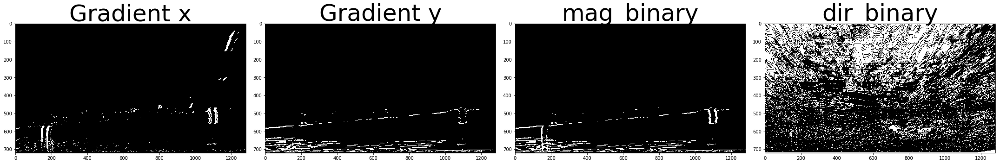

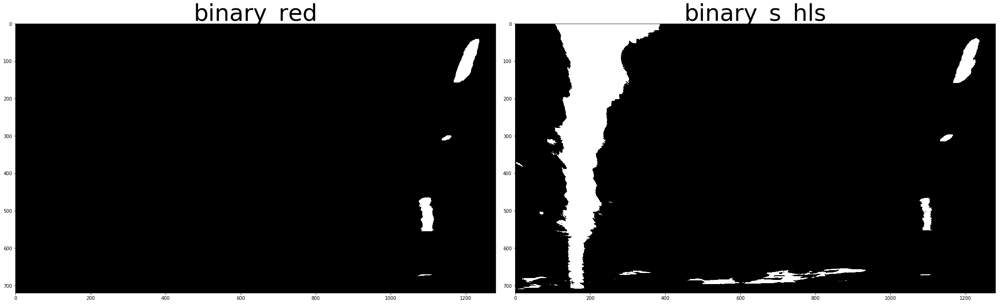

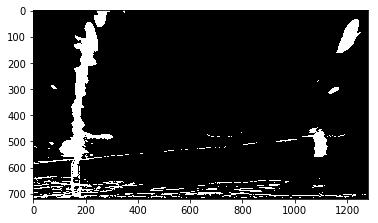

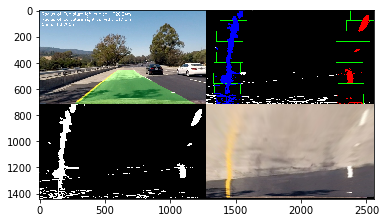

In [19]:
import cv2
img = cv2.imread('test_images/test4.jpg')
#img = cv2.imread('testing/test_img_3_20.jpg')
count = 0
left_fitx = 0
right_fitx = 0
left_fit = 0
right_fit = 0
ploty = 0
leftx = 0
rightx = 0
def process_image_for_video(img) :
    
    print_logs = False
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    
    #cv2.imwrite('testing/test_img_3_'+str(count)+'.jpg',img)
    
    
    global count
    global left_fitx
    global left_fit
    global right_fitx
    global right_fit
    global ploty
    global leftx
    global rightx
    src, dst_points = get_src_destination_points_perspective_transform(index=1)
    
    
    top_down, perspective_M, undist = corners_unwarp(img, src, dst_points, print_statements=False)
    bird_eye_view_image = np.copy(top_down)    
    gradx = abs_sobel_thresh(bird_eye_view_image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(bird_eye_view_image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(bird_eye_view_image, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(bird_eye_view_image, sobel_kernel=ksize, thresh=(0, 0.2))
    r_binary = red_threshold(bird_eye_view_image, thresh = (200, 255))#red binary from cv2.imread(), bgr
    g_binary = green_threshold(bird_eye_view_image, thresh = (200, 255))
    hls_s_binary = hls_s_threshold(bird_eye_view_image, thresh = (90, 255))#s binary from cv2.imread(), hls 

    combined_binary = np.zeros_like(mag_binary)
    #combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1)) | (r_binary==1) & (hls_s_binary==1)] = 1    
    combined_binary[((gradx == 1) & (grady == 1))| ((g_binary == 1)) | ((mag_binary == 1)) | (r_binary==1) & (hls_s_binary==1)] = 1
    
    histogram = get_histogram(combined_binary, print_statements=False)
    Minv = get_Minv(src,dst_points)

    left_fitx, left_fit, leftx, right_fitx, right_fit, rightx, ploty, image_search_window = lane_line(count,left_fitx, left_fit, right_fitx, right_fit, Minv, bird_eye_view_image, undist, histogram, 
              combined_binary, print_image_statment=False)
    
    final_image = unwarp_and_fillPoly(img, combined_binary, left_fitx, right_fitx, ploty, 
                                      Minv, undist, print_image_statments=False)
    
    count = count + 1
    #count = count
    #print('Count in updation' , count)
    
    if print_logs == True :
        #print_undistorted_and_warped_images(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),cv2.cvtColor(top_down,cv2.COLOR_BGR2RGB))
        print_2_images(img,top_down, 'Original Image', 'Undistorted and Warped Image')
        print_bgr_color_images(bird_eye_view_image)
        print_hls_color_images(bird_eye_view_image)
        print_hsv_color_images(bird_eye_view_image)
        print_4_images(gradx,grady,mag_binary,dir_binary,'Gradient x','Gradient y','mag_binary','dir_binary')
        print_2_images(r_binary,hls_s_binary,'binary_red','binary_s_hls')
        plt.figure()
        plt.imshow(combined_binary,cmap='gray')
    
    final_image = set_raduis_curvature(ploty, left_fitx, right_fitx, final_image)
    final_image = set_center(left_fitx[719],right_fitx[719],final_image)
  
    final_image = cv2.cvtColor(final_image,cv2.COLOR_RGB2BGR)
    bird_eye_view_image = cv2.cvtColor(bird_eye_view_image,cv2.COLOR_RGB2BGR)
    
    combined_binary_stack_fit = binary_to_stack_fit(combined_binary) 
        
    stack_image1 = np.hstack((final_image,image_search_window))
    stack_image2 = np.hstack((combined_binary_stack_fit,bird_eye_view_image))
    stack_image3 = np.vstack((stack_image1,stack_image2))
    
    return stack_image3
    

final_image = process_image_for_video(img)
plt.figure()
final_image = cv2.cvtColor(final_image,cv2.COLOR_BGR2RGB)
plt.imshow(final_image)

## Video pipeline
It calls the image pipeline by passing each frame and then appends each frame. Global variables are initialized here.

## Choose a method for processing image
### Method 1:process_image_for_video
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* ** Apply a perspective transform to raw images ("birds-eye view").**
* ** Use color transforms, gradients, etc., to create a thresholded binary image from bird-eye view.**
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

### Method 2: process_image_for_video2
* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* **Apply a distortion correction to raw images.**
* **Use color transforms, gradients, etc., to create a thresholded binary image.**
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

In [32]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

white_output = 'test_videos_output/project_video_full8.mp4'

count = 0
left_fitx = 0
right_fitx = 0
left_fit = 0
right_fit = 0
ploty = 0
clip1 = VideoFileClip("project_video.mp4")
white_clip = clip1.fl_image(process_image_for_video) #NOTE: this function expects color images!!
%time white_clip.write_videofile(white_output, audio=False)

[MoviePy] >>>> Building video test_videos_output/project_video_full8.mp4
[MoviePy] Writing video test_videos_output/project_video_full8.mp4


100%|█████████████████████████████████████████████████████████████████████████████▉| 1260/1261 [09:16<00:00,  2.19it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_videos_output/project_video_full8.mp4 

Wall time: 9min 23s


## Output of the video

In [33]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(white_output))

## Problems

There are many problems that I am facing. Some of them are :

    1) It is not able to handle challenge video. It requires averaging.
    2) No sanity checks have been done. Sanity checks need to be done to start searching using sliding window.
    3) I want to apply thresholds first and then take the top-down view.

These are some of the problems. I will try to work on them so that project looks good.

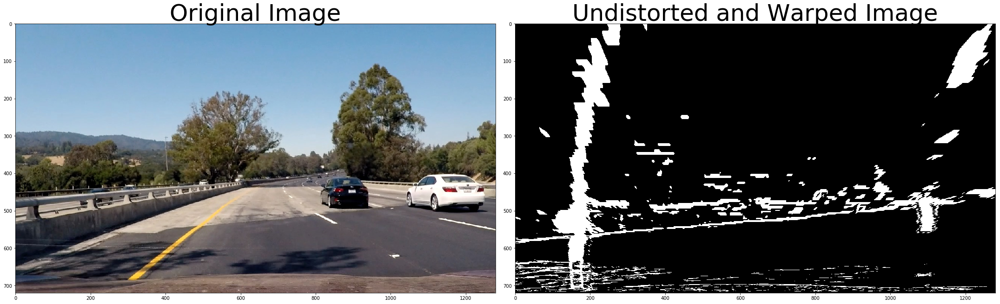

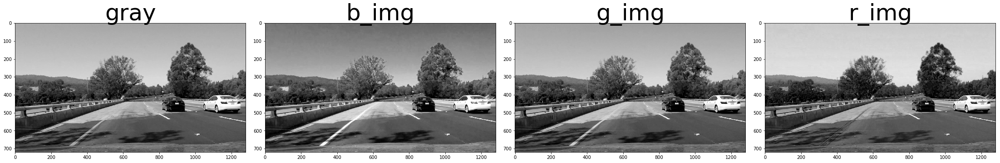

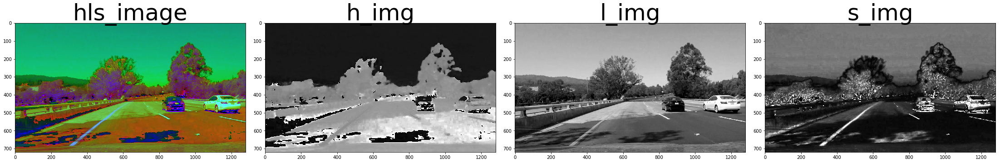

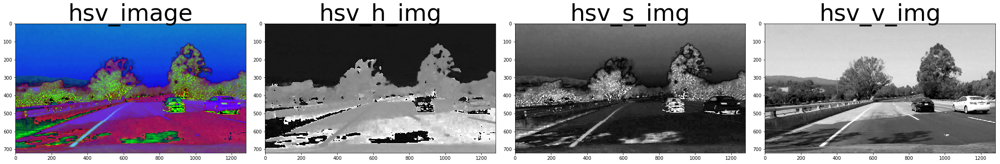

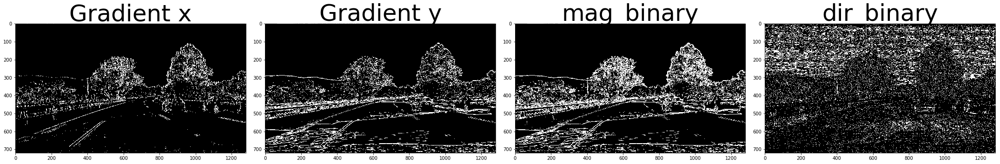

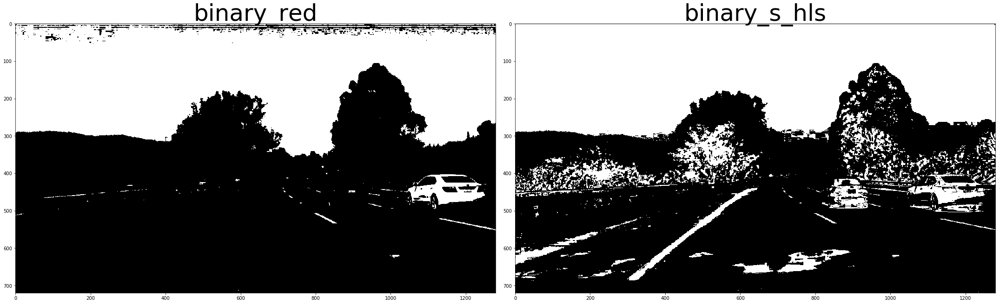

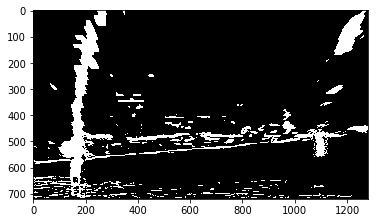

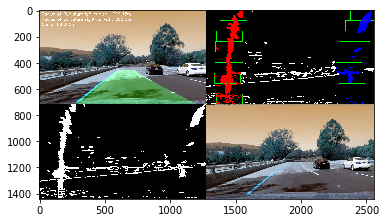

In [31]:
import cv2
img = cv2.imread('test_images/test4.jpg')
#img = cv2.imread('testing/test_img_3_20.jpg')
count = 0
left_fitx = 0
right_fitx = 0
left_fit = 0
right_fit = 0
ploty = 0
leftx = 0
rightx = 0
def process_image_for_video2(img) :
    
    print_logs = False
    img = cv2.cvtColor(img,cv2.COLOR_RGB2BGR)
    
    #cv2.imwrite('testing/test_img_3_'+str(count)+'.jpg',img)
    
    
    global count
    global left_fitx
    global left_fit
    global right_fitx
    global right_fit
    global ploty
    global leftx
    global rightx
    src, dst_points = get_src_destination_points_perspective_transform(index=1)
    
    top_down1, perspective_M1, undist = corners_unwarp(img, src, dst_points, print_statements=False)
    
    bird_eye_view_image = np.copy(img)
    gradx = abs_sobel_thresh(bird_eye_view_image, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady = abs_sobel_thresh(bird_eye_view_image, orient='y', sobel_kernel=ksize, thresh=(20, 100))
    mag_binary = mag_thresh(bird_eye_view_image, sobel_kernel=ksize, mag_thresh=(20, 100))
    dir_binary = dir_threshold(bird_eye_view_image, sobel_kernel=ksize, thresh=(0, 0.2))
    r_binary = red_threshold(bird_eye_view_image, thresh = (200, 255))#red binary from cv2.imread(), bgr
    g_binary = green_threshold(bird_eye_view_image, thresh = (200, 255))
    hls_s_binary = hls_s_threshold(bird_eye_view_image, thresh = (90, 255))#s binary from cv2.imread(), hls 

    combined_binary = np.zeros_like(mag_binary)
    #combined_binary[((gradx == 1) & (grady == 1)) | ((mag_binary == 1)) | (r_binary==1) & (hls_s_binary==1)] = 1    
    combined_binary[((gradx == 1) & (grady == 1))| ((g_binary == 1)) | ((mag_binary == 1)) | (r_binary==1) & (hls_s_binary==1)] = 1

    top_down, perspective_M, undist1 = corners_unwarp(combined_binary, src, dst_points, print_statements=False)
    combined_binary = np.copy(top_down) 
    
    histogram = get_histogram(combined_binary, print_statements=False)
    Minv = get_Minv(src,dst_points)

    left_fitx, left_fit, leftx, right_fitx, right_fit, rightx, ploty, image_search_window = lane_line(count,left_fitx, left_fit, right_fitx, right_fit, Minv, bird_eye_view_image, undist, histogram, 
              combined_binary, print_image_statment=False)
    
    final_image = unwarp_and_fillPoly(img, combined_binary, left_fitx, right_fitx, ploty, 
                                      Minv, undist, print_image_statments=False)
    
    count = count + 1
    #count = count
    #print('Count in updation' , count)
    
    if print_logs == True :
        #print_undistorted_and_warped_images(cv2.cvtColor(img,cv2.COLOR_BGR2RGB),cv2.cvtColor(top_down,cv2.COLOR_BGR2RGB))
        print_2_images(img,top_down, 'Original Image', 'Undistorted and Warped Image')
        print_bgr_color_images(bird_eye_view_image)
        print_hls_color_images(bird_eye_view_image)
        print_hsv_color_images(bird_eye_view_image)
        print_4_images(gradx,grady,mag_binary,dir_binary,'Gradient x','Gradient y','mag_binary','dir_binary')
        print_2_images(r_binary,hls_s_binary,'binary_red','binary_s_hls')
        plt.figure()
        plt.imshow(combined_binary,cmap='gray')
    
    final_image = set_raduis_curvature(ploty, left_fitx, right_fitx, final_image)
    final_image = set_center(left_fitx[719],right_fitx[719],final_image)
  
    final_image = cv2.cvtColor(final_image,cv2.COLOR_RGB2BGR)
    bird_eye_view_image = cv2.cvtColor(bird_eye_view_image,cv2.COLOR_RGB2BGR)
    
    combined_binary_stack_fit = binary_to_stack_fit(combined_binary) 
        
    stack_image1 = np.hstack((final_image,image_search_window))
    stack_image2 = np.hstack((combined_binary_stack_fit,bird_eye_view_image))
    stack_image3 = np.vstack((stack_image1,stack_image2))
    
    return stack_image3
    

final_image = process_image_for_video(img)
plt.figure()
#final_image = cv2.cvtColor(final_image,cv2.COLOR_BGR2RGB)
plt.imshow(final_image)